# Downloading Dataset

In [49]:
!curl -L 'ftp://ftp.cs.toronto.edu/pub/neuron/delve/data/tarfiles/adult.tar.gz' -o adult.tar.gz
import tarfile
file = tarfile.open("adult.tar.gz", mode = "r:gz")
file.extractall()
file.close()
import pandas as pd
df = pd.read_csv("adult/Dataset.data.gz", sep = " ", header = None, )

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 1806k  100 1806k    0     0  1010k      0  0:00:01  0:00:01 --:--:-- 1010k


## Importing libraries

In [0]:
import pandas as pd
import numpy as np
from sklearn.neural_network import MLPClassifier
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix

# Data Preprocessing

### Renaming Columns

In [0]:
# Renaming the columns to their appropriate names as defined in the documentation
df.rename(columns = {0:"Age",1:"Workclass",2:"Amount_Of_People",3:"Education",4:"Education_number",5:"marital_status",6:"Occupation",7:"Relationship",8:"Race",9:"Gender",10:"Capital_gain",11:"Capital_loss",12:"Hours_Per_Week",13:"Native_Country",14:"Income_Bracket"},inplace = True)

In [0]:
# Replacing questionmarks with NaN value and dropping nulls for dataset cleaning
df = df.replace("?", 0)
df = df.dropna()

### Checking the DataFrame

In [53]:
df.head()

,Age,Workclass,Amount_Of_People,Education,Education_number,marital_status,Occupation,Relationship,Race,Gender,Capital_gain,Capital_loss,Hours_Per_Week,Native_Country,Income_Bracket
0,25,Private,226802,11th,7,Never-married,Machine-op-inspct,Own-child,Black,Male,0,0,40,United-States,<=50K
1,38,Private,89814,HS-grad,9,Married-civ-spouse,Farming-fishing,Husband,White,Male,0,0,50,United-States,<=50K
2,28,Local-gov,336951,Assoc-acdm,12,Married-civ-spouse,Protective-serv,Husband,White,Male,0,0,40,United-States,>50K
3,44,Private,160323,Some-college,10,Married-civ-spouse,Machine-op-inspct,Husband,Black,Male,7688,0,40,United-States,>50K
4,18,0,103497,Some-college,10,Never-married,0,Own-child,White,Female,0,0,30,United-States,<=50K


In [54]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 48842 entries, 0 to 48841
Data columns (total 15 columns):
Age                 48842 non-null int64
Workclass           48842 non-null object
Amount_Of_People    48842 non-null int64
Education           48842 non-null object
Education_number    48842 non-null int64
marital_status      48842 non-null object
Occupation          48842 non-null object
Relationship        48842 non-null object
Race                48842 non-null object
Gender              48842 non-null object
Capital_gain        48842 non-null int64
Capital_loss        48842 non-null int64
Hours_Per_Week      48842 non-null int64
Native_Country      48842 non-null object
Income_Bracket      48842 non-null object
dtypes: int64(6), object(9)
memory usage: 6.0+ MB


### Mapping Variables to binary values

In [55]:
df["Income_Bracket"] = df.Income_Bracket.map({">50K":1,"<=50K":0})
df["Gender"] = df.Gender.map({"Male" : 0, "Female" : 1})

df.head()


,Age,Workclass,Amount_Of_People,Education,Education_number,marital_status,Occupation,Relationship,Race,Gender,Capital_gain,Capital_loss,Hours_Per_Week,Native_Country,Income_Bracket
0,25,Private,226802,11th,7,Never-married,Machine-op-inspct,Own-child,Black,0,0,0,40,United-States,0
1,38,Private,89814,HS-grad,9,Married-civ-spouse,Farming-fishing,Husband,White,0,0,0,50,United-States,0
2,28,Local-gov,336951,Assoc-acdm,12,Married-civ-spouse,Protective-serv,Husband,White,0,0,0,40,United-States,1
3,44,Private,160323,Some-college,10,Married-civ-spouse,Machine-op-inspct,Husband,Black,0,7688,0,40,United-States,1
4,18,0,103497,Some-college,10,Never-married,0,Own-child,White,1,0,0,30,United-States,0


In [0]:
#Create new dataframe for correlogram
num_df = df.select_dtypes(exclude=['object'])
cat_df = df.select_dtypes(include=['object'])



### One-hot Encoding
#### Creating the One-hot Encoding columns for all the variables

In [0]:
workclass = pd.get_dummies(df["Workclass"],prefix = "Workclass")
marital_status = pd.get_dummies(df["marital_status"],prefix = "Marital_status")
occupation = pd.get_dummies(df["Occupation"],prefix = "Occupation")
race = pd.get_dummies(df["Race"],prefix = "Race")
native_country = pd.get_dummies(df["Native_Country"],prefix = "Native_Country")
relationship = pd.get_dummies(df["Relationship"],prefix="Relationship")

#### Concatting the new one-hot encoded columns to the DataFrame

In [0]:
df_encoded = pd.concat([df,workclass,marital_status,relationship,occupation,race,native_country], axis = 1)

#### Deleting original columns from the DataFrame

In [59]:
df_encoded.drop(["Workclass","Education","marital_status","Relationship","Occupation","Race","Native_Country"],inplace = True, axis = 1)
df_encoded.head()

,Age,Amount_Of_People,Education_number,Gender,Capital_gain,Capital_loss,Hours_Per_Week,Income_Bracket,Workclass_0,Workclass_Federal-gov,Workclass_Local-gov,Workclass_Never-worked,Workclass_Private,Workclass_Self-emp-inc,Workclass_Self-emp-not-inc,Workclass_State-gov,Workclass_Without-pay,Marital_status_Divorced,Marital_status_Married-AF-spouse,Marital_status_Married-civ-spouse,Marital_status_Married-spouse-absent,Marital_status_Never-married,Marital_status_Separated,Marital_status_Widowed,Relationship_Husband,Relationship_Not-in-family,Relationship_Other-relative,Relationship_Own-child,Relationship_Unmarried,Relationship_Wife,Occupation_0,Occupation_Adm-clerical,Occupation_Armed-Forces,Occupation_Craft-repair,Occupation_Exec-managerial,Occupation_Farming-fishing,Occupation_Handlers-cleaners,Occupation_Machine-op-inspct,Occupation_Other-service,Occupation_Priv-house-serv,...,Native_Country_Canada,Native_Country_China,Native_Country_Columbia,Native_Country_Cuba,Native_Country_Dominican-Republic,Native_Country_Ecuador,Native_Country_El-Salvador,Native_Country_England,Native_Country_France,Native_Country_Germany,Native_Country_Greece,Native_Country_Guatemala,Native_Country_Haiti,Native_Country_Holand-Netherlands,Native_Country_Honduras,Native_Country_Hong,Native_Country_Hungary,Native_Country_India,Native_Country_Iran,Native_Country_Ireland,Native_Country_Italy,Native_Country_Jamaica,Native_Country_Japan,Native_Country_Laos,Native_Country_Mexico,Native_Country_Nicaragua,Native_Country_Outlying-US(Guam-USVI-etc),Native_Country_Peru,Native_Country_Philippines,Native_Country_Poland,Native_Country_Portugal,Native_Country_Puerto-Rico,Native_Country_Scotland,Native_Country_South,Native_Country_Taiwan,Native_Country_Thailand,Native_Country_Trinadad&Tobago,Native_Country_United-States,Native_Country_Vietnam,Native_Country_Yugoslavia
0,25,226802,7,0,0,0,40,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
1,38,89814,9,0,0,0,50,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
2,28,336951,12,0,0,0,40,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
3,44,160323,10,0,7688,0,40,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
4,18,103497,10,1,0,0,30,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0


### Defining X and Y Variables

In [0]:
y = df[["Income_Bracket"]]
X = df_encoded.loc[:, df_encoded.columns != "Income_Bracket"]

# Exploration and Analysis
## Plotting correlation for numerical values

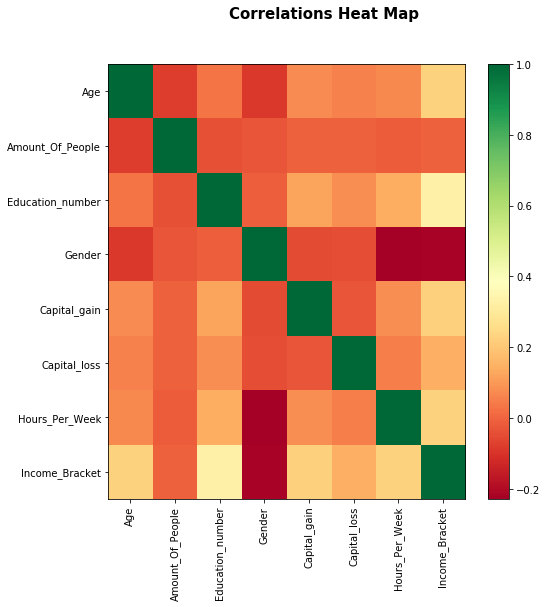

In [61]:
#Compute Percentage Change
#???
pct_change = num_df.pct_change()
#Compute Correlation
corr = num_df.corr()

plt.figure(figsize=(8, 8))
plt.imshow(corr, cmap='RdYlGn', interpolation='none', aspect='auto')
plt.colorbar()
plt.xticks(range(len(corr)), corr.columns, rotation='vertical')
plt.yticks(range(len(corr)), corr.columns);
plt.suptitle('Correlations Heat Map', fontsize=15, fontweight='bold')
plt.show()



## Distribution

[[    0     1]
 [37155 11687]]


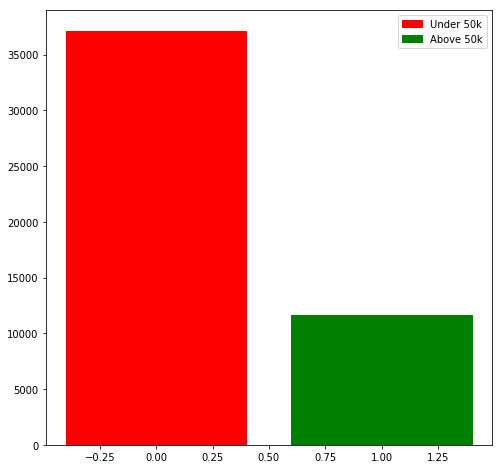

In [62]:
unique, counts = np.unique(df["Income_Bracket"], return_counts=True)
print(np.asarray((unique, counts))) 
plt.figure(figsize=(8,8)) 
barlist = plt.bar(unique, counts)
barlist[0].set_label('Under 50k')
barlist[1].set_label('Above 50k')
barlist[0].set_color('r')
barlist[1].set_color('g') 
plt.legend()
plt.show()

##Scaling

### Scaling the data

In [63]:
X_forest = X
scaler = StandardScaler()
X = scaler.fit_transform(X)


/usr/local/lib/python3.6/dist-packages/sklearn/preprocessing/data.py:645: DataConversionWarning: Data with input dtype uint8, int64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
/usr/local/lib/python3.6/dist-packages/sklearn/base.py:464: DataConversionWarning: Data with input dtype uint8, int64 were all converted to float64 by StandardScaler.
  return self.fit(X, **fit_params).transform(X)


### Splitting into test and train data

In [0]:
from sklearn.model_selection import train_test_split
xTrain, xTest, yTrain, yTest = train_test_split(X, y, test_size = 0.2, random_state = 1)

xTrain_forest, xTest_forest, yTrain_forest, yTest_forest = train_test_split (X, y, test_size = 0.2, random_state = 1)

#Random Forest

In [65]:
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier(random_state = 1)
from pprint import pprint
# Look at parameters used by our current forest
print('Parameters currently in use:\n')
pprint(rf.get_params())

Parameters currently in use:

{'bootstrap': True,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 'warn',
 'n_jobs': None,
 'oob_score': False,
 'random_state': 1,
 'verbose': 0,
 'warm_start': False}


### Grid Search with cross-vlidation

In [0]:
from sklearn.model_selection import GridSearchCV
# Create the parameter grid based on the results of random search 
param_grid = {
    'bootstrap': [True],
    'max_depth': [15, 20, 25, 30],
    'max_features': ["auto",],
    'min_samples_leaf': [3, 4, 5],
    'min_samples_split': [10, 12, 14],
    'n_estimators': [150, 200, 250, 300]
}

# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = 3, n_jobs = -1, verbose = 2)


In [0]:
##Fit the grid search to the data (outcommented because it takes very long)
#grid_search.fit(xTrain, yTrain)



In [0]:
##showing the best parameters (outcommented because no grid_search)
#grid_search.best_params_



### Testing with new Hyperparameters


In [67]:
from sklearn.metrics import accuracy_score
# Parameters decided through previous grid search
rf_test = RandomForestClassifier(random_state=1, n_estimators=150, bootstrap=True, max_depth=30, max_features="auto", min_samples_leaf=3, min_samples_split=12)

rf_fitted = rf_test.fit(xTrain_forest, yTrain_forest.values.ravel())
predictions =rf_fitted.predict(xTest_forest)

print ("Test Accuracy  :: ", accuracy_score(yTest_forest, predictions))
 

Test Accuracy  ::  0.8652881564131436


### Figuring out the top 5 features

In [0]:

temp=[]
temp.append(rf_fitted.feature_importances_)
temp_sorted = temp.sort()
features_df =  pd.DataFrame(temp, columns=X_forest.columns)
features_sorted = features_df.sort_values(by=0, axis=1, ascending=False)
features_sorted.head()
features_top5 = features_sorted[features_sorted.columns[0:5]]


### Plotting the most important features

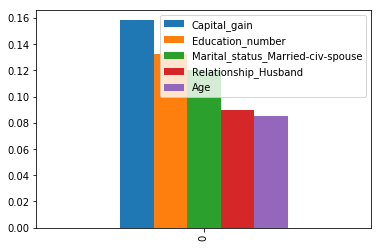

In [21]:
top5 = features_top5.plot.bar()
top5


### Visualizing Decision Tree


In [46]:

# visualize tree
from sklearn.externals.six import StringIO
from IPython.display import Image
from sklearn.tree import export_graphviz
import pydotplus

dot_data = StringIO()

export_graphviz(
        rf_fitted.estimators_[1],
        out_file= dot_data,
        feature_names=X_forest.columns,
        rounded=True,
        filled=True
    )

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.831502 to fit



## Visualizing Confusionmatrix

[[6988  917]
 [ 399 1465]]
Confusion matrix, without normalization
[[6988  399]
 [ 917 1465]]
Normalized confusion matrix
[[0.95 0.05]
 [0.38 0.62]]


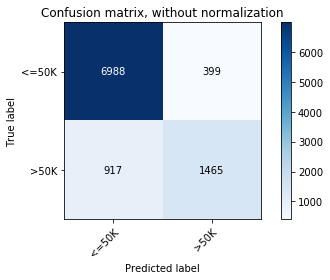

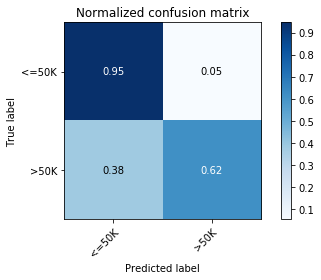

In [47]:
from sklearn.metrics import confusion_matrix

conf_mat = confusion_matrix(predictions, yTest)
print(conf_mat)


import numpy as np
import matplotlib.pyplot as plt

from sklearn import svm, datasets
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.utils.multiclass import unique_labels


class_names = ["<=50K", ">50K"]

# Run classifier, using a model that is too regularized (C too low) to see
# the impact on the results

def plot_confusion_matrix(y_true, y_pred, classes,
                          normalize=False,
                          title=None,
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if not title:
      if normalize:
          title = 'Normalized confusion matrix'
      else:
          title = 'Confusion matrix, without normalization'

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    # Only use the labels that appear in the data

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    
    fig, ax = plt.subplots()
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    ax.figure.colorbar(im, ax=ax)
    # We want to show all ticks...
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           # ... and label them with the respective list entries
           xticklabels=classes, yticklabels=classes,
           title=title,
           ylabel='True label',
           xlabel='Predicted label')

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")

    # Loop over data dimensions and create text annotations.
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], fmt),
                    ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")
    fig.tight_layout()
    return ax


np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plot_confusion_matrix(yTest, predictions, classes=class_names,
                      title='Confusion matrix, without normalization')

# Plot normalized confusion matrix
plot_confusion_matrix(yTest, predictions, classes=class_names, normalize=True,
                      title='Normalized confusion matrix')

plt.show()

# Neural Network

## Instantiate neural network model

In [0]:
clf = MLPClassifier(activation = 'relu',alpha =0.05, hidden_layer_sizes = (100,), learning_rate = 'constant', solver = 'sgd')


##Grid Search

In [0]:
##Define parameters for gridsearch
#parameters={'hidden_layer_sizes': [(50,50,50), (50,100,50), (100,), (20,10), (10,10)],
#            'activation': ['tanh', 'relu'],
#            'solver': ['sgd', 'adam'],
#            'alpha': [0.0001, 0.05],
#            'learning_rate': ['constant','adaptive']
#            }
#
##Performs gridsearch on the parameters
#clf_grid = GridSearchCV(clf, param_grid=parameters, cv=3)
#clf_grid.fit(X, y)
#clf_grid.best_estimator_
#clf_grid.best_params_
#clf_grid.score(X_test, y_test)
#pred = clf_grid.predict(X_test)



##Fitting the model

In [49]:
#fits model
neural_model = clf.fit(xTrain, yTrain)

#Performs prediction
prediction = clf.predict(xTest)

#analyses accuracy
accuracy_score(yTest, prediction)

/usr/local/lib/python3.6/dist-packages/sklearn/neural_network/multilayer_perceptron.py:916: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


0.8566895280990889

## Confusion matrix

Confusion matrix, without normalization
[[6854  533]
 [ 867 1515]]
Normalized confusion matrix
[[0.93 0.07]
 [0.36 0.64]]


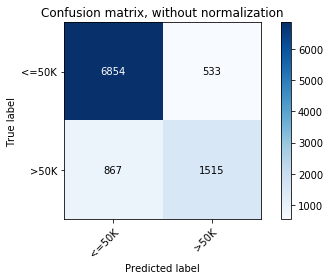

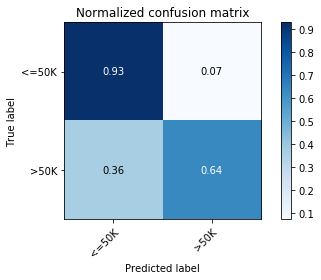

In [50]:
# Plot non-normalized confusion matrix
plot_confusion_matrix(yTest, prediction, classes=class_names,
                      title='Confusion matrix, without normalization')

# Plot normalized confusion matrix
plot_confusion_matrix(yTest, prediction, classes=class_names, normalize=True,
                      title='Normalized confusion matrix')

plt.show()


# Support Vector Classifiers

## Linear SVC Grid Search

In [0]:
from sklearn.svm import LinearSVC
svc_linear = LinearSVC(C= 0.6)

### Grid Search

In [0]:
#svc_linear_params = {"C": [0.1, 0.2, 0.3,0.4,0.5,0.6,0.7,0.8,0.9,1]}
#svc_linear_grid_search = GridSearchCV(svc_linear, svc_linear_params, cv = 10, scoring = "f1_micro",n_jobs = -1)
#svc_linear_grid_search.fit(xTrain,yTrain)
#print(svc_linear_grid_search.best_score_, svc_linear_grid_search.best_params_)

### Accuracy Score for optimal Linear SVC

In [53]:

svc_linear_optimal = LinearSVC(C = 0.6)
svc_linear_optimal.fit(xTrain,yTrain)
svc_linear_optimal_predict = svc_linear_optimal.predict(xTest)

accuracy_score(yTest, svc_linear_optimal_predict)



/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:761: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


0.8548469648889344

## RBF SVC

In [0]:
from sklearn.svm import SVC
svc_rbf = SVC(kernel = "rbf")

### Grid Search

In [0]:
#svc_rbf_params = {"C": [0.1, 0.2, 0.3,0.4,0.5,0.6,0.7,0.8,0.9,1]}
#svc_rbf_grid_search = GridSearchCV(svc_rbf, svc_rbf_params, cv = 10)
#svc_rbf_grid_search.fit(xTrain,yTrain)
#print(svc_rbf_grid_search.best_score_, svc_rbf_grid_search.best_params_)

### Accuracy Score for RBF SVC with optimal Hyperparameters

In [0]:
svc_rbf_optimal = SVC(kernel = "rbf",C=1)
svc_rbf_optimal.fit(xTrain,yTrain)
svc_rbf_optimal.score(xTest,yTest)

/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:761: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


## Poly Kernel SVC GridSearch

In [0]:
#svc_poly = SVC(kernel = "poly")
#svc_poly_params = {"C": [0.1,0.5,1], "degree":[2,3], "gamma":[0.5,1,2]}
#svc_poly_grid_search = GridSearchCV(svc_poly, svc_poly_params, cv = 3)
#svc_poly_grid_search.fit(xTrain,yTrain)
#print(svc_poly_grid_search.best_score_, svc_poly_grid_search.best_params_)

###Accuracy Score for Poly Kernel SVC with optimal hyperparameters

In [0]:
svc_poly_optimal = SVC(kernel = "poly", C = 1, degree = 2, gamma = "auto")
svc_poly_optimal.fit(xTrain,yTrain)
svc_poly_optimal.score(xTest,yTest)

## Plotting Coefficients for linear SVC

In [0]:
def plot_coefficients(classifier, feature_names, top_features=5):
    coef = classifier.coef_.ravel()
    top_positive_coefficients = np.argsort(coef)[-top_features:]
    top_negative_coefficients = np.argsort(coef)[:top_features]
    top_coefficients = np.hstack([top_negative_coefficients,top_positive_coefficients])
    # create plot
    plt.figure(figsize = (15,5))
    colors = ["red" if c< 0 else "blue" for c in coef[top_coefficients]]
    plt.bar(np.arange(2*top_features), coef[top_coefficients], color = colors)
    feature_names = np.array(feature_names)
    plt.xticks(np.arange(0,1 + 2 * top_features), feature_names[top_coefficients], rotation = 60, ha = "right")
    plt.show()
    
plot_coefficients(svc_linear_optimal, df_encoded.loc[:, df_encoded.columns != "Income_Bracket"].columns)

## Plotting Confusion Matrix for linear SVC

In [0]:
# Plot non-normalized confusion matrix
plot_confusion_matrix(yTest, svc_linear_optimal_predict, classes=class_names,
                      title='Confusion matrix, without normalization')

# Plot normalized confusion matrix
plot_confusion_matrix(yTest, svc_linear_optimal_predict, classes=class_names, normalize=True,
                      title='Normalized confusion matrix')

plt.show()